In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
"""
Desired Features:

[] Hooks to look at percentages of zero activations
[] Incorporate tabular data (can create an nn.Module that concatenates the two)
[] Add strategic cropping (to make them square)
[] Remove all other transforms!!
[] More sophisticated dataframe filtering
[] Add a test set from other users (not trained on any of their pictures)
[] Learn how to mix models without removing the weights from transfer learning





"""

'\nDesired Features:\n\n[] Hooks to look at percentages of zero activations\n[] Incorporate tabular data (can create an nn.Module that concatenates the two)\n[] Add strategic cropping (to make them square)\n[] Remove all other transforms!!\n[] More sophisticated dataframe filtering\n[] Add a test set from other users (not trained on any of their pictures)\n[] Learn how to mix models without removing the weights from transfer learning\n\n\n\n\n\n'

In [3]:
"""class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.cnn = models.inception_v3(pretrained=False, aux_logits=False)
        self.cnn.fc = nn.Linear(
            self.cnn.fc.in_features, 20)
        
        self.fc1 = nn.Linear(20 + 10, 60)
        self.fc2 = nn.Linear(60, 5)
        
    def forward(self, image, data):
        x1 = self.cnn(image)
        x2 = data
        
        x = torch.cat((x1, x2), dim=1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x
        

model = MyModel()

batch_size = 2
image = torch.randn(batch_size, 3, 299, 299)
data = torch.randn(batch_size, 10)

output = model(image, data)"""

'class MyModel(nn.Module):\n    def __init__(self):\n        super(MyModel, self).__init__()\n        self.cnn = models.inception_v3(pretrained=False, aux_logits=False)\n        self.cnn.fc = nn.Linear(\n            self.cnn.fc.in_features, 20)\n        \n        self.fc1 = nn.Linear(20 + 10, 60)\n        self.fc2 = nn.Linear(60, 5)\n        \n    def forward(self, image, data):\n        x1 = self.cnn(image)\n        x2 = data\n        \n        x = torch.cat((x1, x2), dim=1)\n        x = F.relu(self.fc1(x))\n        x = self.fc2(x)\n        return x\n        \n\nmodel = MyModel()\n\nbatch_size = 2\nimage = torch.randn(batch_size, 3, 299, 299)\ndata = torch.randn(batch_size, 10)\n\noutput = model(image, data)'

In [4]:
from fastai.vision import *
from fastai.tabular import *
from fastai.callbacks import *

import numpy as np
import pandas as pd

In [5]:
path = 'Output'

df = pd.read_csv('Post_Processed.csv')

df = df[~np.isnan(df['red'])]

for name in df.columns:
    if name.startswith('Unnamed'): df.drop(name, axis = 1, inplace = True)
        

dep_var = 'performance'
dep_var = 'engagement_factor_moving_avg'


cat_names = ['year', 
             'day_name', 
             'month',
             'username']
cont_names = ['followers', 
              'following', 
              'num_posts', 
              'rolling_avg', 
              #'minute', 
              #'second',  
              #'date', 
              'hour',
              'brightness',
              'contrast',
             ]
procs = [FillMissing, Categorify]#, Normalize]


df = df[~np.isnan(df[dep_var])]
#df = df[[isinstance(x, str) for x in df[dep_var]]]
#df = df[df['Downloaded'] == 1]

print (len(df))

13848


# Tabular Model

In [6]:
tab_data = (TabularList.from_df(df, path = path, cat_names = cat_names, cont_names = cont_names, procs = procs)
        .split_by_rand_pct()
        .label_from_df(cols = dep_var)
        .databunch(num_workers = 0)
       )

In [7]:
tab_learn = tabular_learner(tab_data, layers = [10000,500, 100])#, metrics=[accuracy])

epoch,train_loss,valid_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


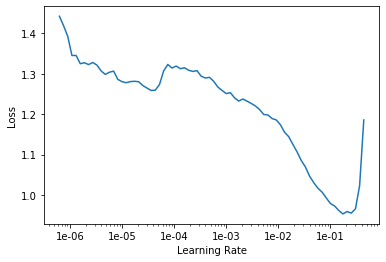

In [9]:
tab_learn.lr_find()
tab_learn.recorder.plot()

In [10]:
tab_learn.fit_one_cycle(10, max_lr = 1e-2)

epoch,train_loss,valid_loss,time
0,0.380906,0.211071,00:25
1,0.234084,0.212452,00:24


KeyboardInterrupt: 

In [19]:
learn.show_results(10)

year,day_name,month,username,brightness_na,contrast_na,followers,following,num_posts,rolling_avg,hour,brightness,contrast,target,prediction
2019.0,7.0,2.0,localhaven,False,False,129270.0000,1341.0000,2584.0000,2391.3000,21.0000,185.1084,214.0000,1.765985,[0.999232]
2018.0,7.0,3.0,localhaven,False,False,129270.0000,1341.0000,2584.0000,1423.4000,16.0000,167.2249,194.0000,1.1310946,[0.980951]
2017.0,5.0,12.0,localhaven,False,False,129270.0000,1341.0000,2584.0000,1455.5000,1.0000,169.4547,215.0000,0.8182755,[0.948332]
2017.0,3.0,4.0,localhaven,False,False,129270.0000,1341.0000,2584.0000,1562.1000,13.0000,169.3820,214.0000,0.97624993,[0.961058]
2018.0,5.0,3.0,localhaven,False,False,129270.0000,1341.0000,2584.0000,1379.1500,21.0000,157.6416,192.0000,1.4001378,[0.968331]


In [ ]:
result_counter = {'Normal': 0, 'Low':0, 'High':0}
for i, _ in df.iterrows():
    pred = learn.predict(df.iloc[i])[0].obj
    result_counter[pred] += 1
print (f"High: {result_counter['High']}, Med: {result_counter['Normal']}, Low: {result_counter['Low']}")

In [8]:
df['filename'] = [url.split(r'/')[-2] for url in df['Links']]

In [9]:
df.head()

,Downloaded,Engagement (Avg Likes),Links,alt-text,caption,followers,following,likes,num_posts,posttime,...,day_name,performance,red,green,blue,brightness,red_range,green_range,blue_range,contrast
10,1.0,NaN,https://www.instagram.com/p/B6rIiJMBNuK/,Image may contain: food,Yogurt dips always and forever. Labne with Siz...,129270,1341,3003.0,2584,2019-12-29T22:59:01.000Z,...,7.0,High,165.758434,155.697325,147.319075,156.258278,224.0,226.0,236.0,232.0
11,1.0,NaN,https://www.instagram.com/p/BuR4MIuB_1i/,Image may contain: food,Made @basically Chicken and Rice Soup with Gar...,129270,1341,4223.0,2584,2019-02-24T21:18:27.000Z,...,7.0,High,195.326505,187.656672,172.342082,185.108420,202.0,185.0,235.0,214.0
12,1.0,NaN,https://www.instagram.com/p/BgMKji2DXPe/,"Photo by Ashley Marti on March 11, 2018.",golden beet hummus with sesame oil,129270,1341,1610.0,2584,2018-03-11T16:43:59.000Z,...,7.0,High,189.139726,170.260187,142.274926,167.224946,152.0,180.0,213.0,194.0
13,1.0,NaN,https://www.instagram.com/p/Bc_EitTjWl5/,"Photo shared by Ashley Marti on December 21, 2...",Taking a break from all of the holiday cookies...,129270,1341,1191.0,2584,2017-12-22T01:07:08.000Z,...,5.0,Low,178.292824,170.629448,159.441829,169.454700,201.0,212.0,224.0,215.0
14,1.0,NaN,https://www.instagram.com/p/BTWasLfDfN4/,Photo by Ashley Marti in Elder Hall with @will...,PORTLAND #giveaway! Enter to win a seat at the...,129270,1341,1525.0,2584,2017-04-26T13:29:15.000Z,...,3.0,Normal,176.551989,171.092073,160.501949,169.382004,209.0,212.0,219.0,214.0


# Image Model

In [6]:
#defaults.device = torch.device('cpu')
#defaults.device = torch.device('cuda')

In [7]:
data = (ImageList.from_df(df = df, path = 'Output', cols = 'filename', suffix = '.jpg')
        #.filter_by_func(lambda x: print(x))
        .split_by_rand_pct()
        .label_from_df(cols = dep_var)
        .transform([[],[]], size = 400)
        .databunch(bs = 32, num_workers = 0)
       )

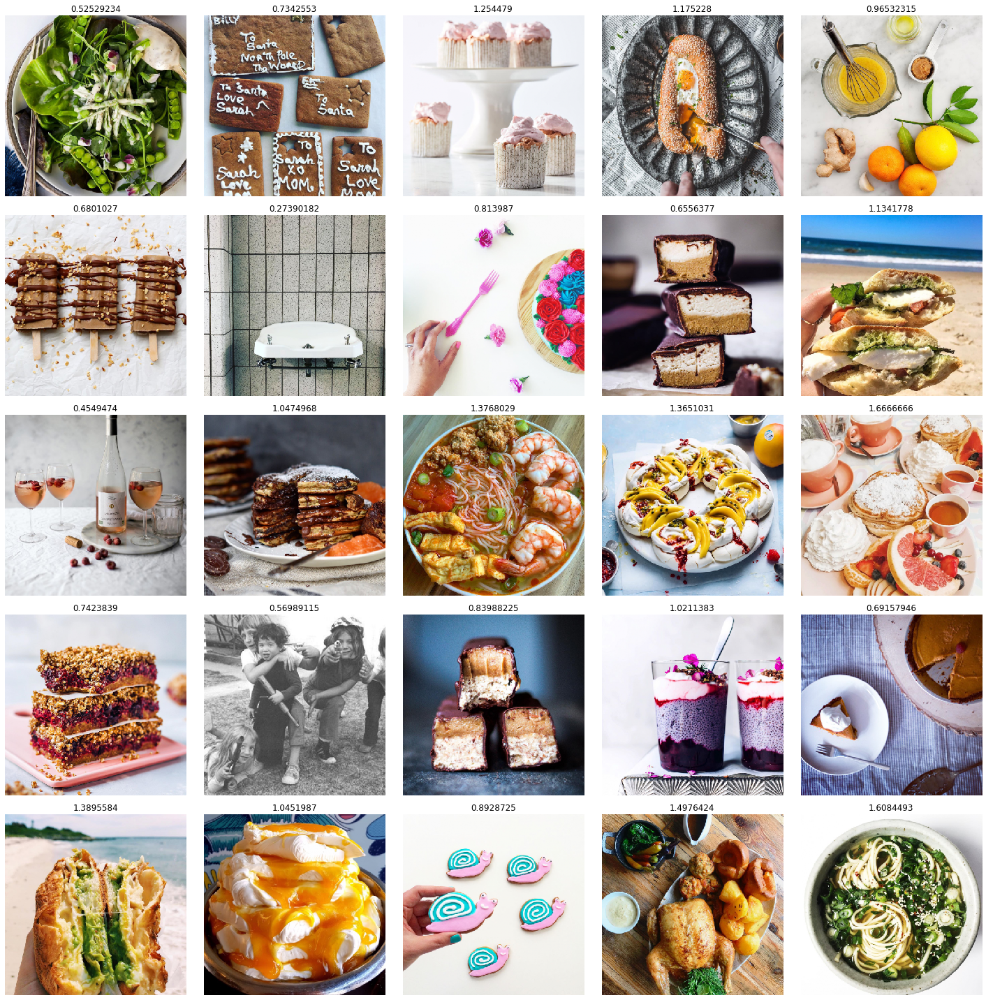

In [8]:
data.show_batch()

In [9]:
learn = cnn_learner(data, models.resnet34)

In [14]:
learn.lr_find()

epoch,train_loss,valid_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


KeyboardInterrupt: 

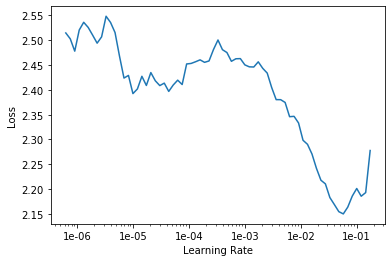

In [22]:
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(5, max_lr = 1e-2)

epoch,train_loss,valid_loss,time
0,0.444453,0.278413,2:33:44


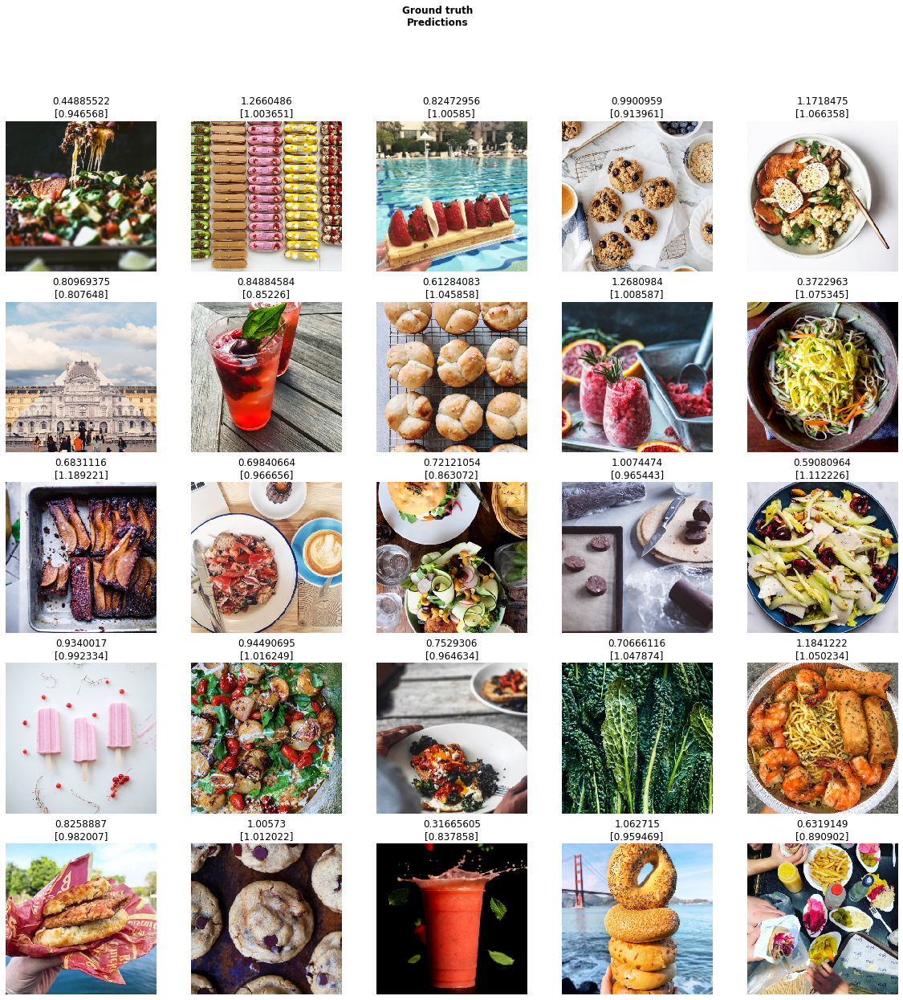

In [15]:
learn.show_results()

In [25]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


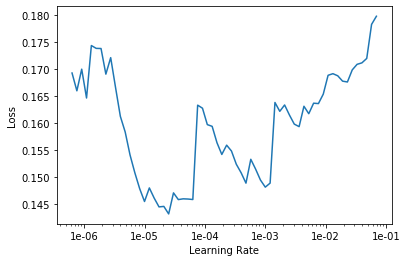

In [26]:
learn.lr_find()
learn.recorder.plot()

In [27]:
learn.fit_one_cycle(20, 1e-2/10)

epoch,train_loss,valid_loss,time
0,0.161185,0.163960,23:44
1,0.167892,0.173316,23:32
2,0.170984,0.168907,23:21
3,0.169163,0.177954,23:08
4,0.175433,0.169510,23:11
5,0.169941,0.169419,23:07
6,0.167642,0.169943,23:21
7,0.171580,0.169542,23:43
8,0.169389,0.168729,23:27
9,0.169895,0.168788,23:37


In [ ]:
learn.export('Second Attempt.pkl')

In [30]:
interp = learn.interpret()

In [ ]:
learn = load_learner('First Attempt.pkl', num_workers = 0)

In [ ]:
imterp.

# Combined Model

In [74]:
tabular_data = TabularList.from_df(df, path = path, cat_names = cat_names, cont_names = cont_names, procs = procs)
image_data = ImageList.from_df(df = df, path = path, cols = 'filename', suffix = '.jpg')

In [23]:
mdl = models.resnet34(pretrained = True)

In [20]:
nn.Sequential(learn.model, learn.model)

Sequential(
  (0): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, 

In [24]:
type(mdl)

torchvision.models.resnet.ResNet

In [27]:
mdl(torch.zeros(64, 3, 10,10))

KeyboardInterrupt: 

In [29]:
??models.resnet34

In [34]:
for child in models.resnet34(pretrained = True).children():
    print (child)

Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
ReLU(inplace)
MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
Sequential(
  (0): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): 

In [36]:
models.resnet34(pretrained = True)[:10]

TypeError: 'ResNet' object is not subscriptable

In [42]:
for i,child in enumerate(learn.model.children()):
    print (i,type(child), child, isinstance(child, nn.Sequential))

0 <class 'torch.nn.modules.container.Sequential'> Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu

In [41]:
nn.Sequential(*list(learn.model.children()))

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

In [9]:
def extract_all_layers(sequence, layers = []):
    for child in sequence.children():
        if isinstance(child, nn.Sequential): layers = extract_all_layers(child, layers)
        else: layers.append(child)
    return layers

In [51]:
lls = extract_all_layers(learn.model)

In [52]:
len(lls)

73

In [53]:
lls[:]

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 ReLU(inplace),
 MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False),
 BasicBlock(
   (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (relu): ReLU(inplace)
   (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 ),
 BasicBlock(
   (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (relu): ReLU(inplace)
   (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (bn2): BatchNorm2d(64, eps=1e-05,

In [54]:
last_layer = lls[-1]

In [56]:
last_layer.out_features

1

In [61]:
tab_learn.model

TabularModel(
  (embeds): ModuleList(
    (0): Embedding(9, 5)
    (1): Embedding(8, 5)
    (2): Embedding(13, 7)
    (3): Embedding(67, 17)
  )
  (emb_drop): Dropout(p=0.0)
  (bn_cont): BatchNorm1d(7, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layers): Sequential(
    (0): Linear(in_features=41, out_features=10000, bias=True)
    (1): ReLU(inplace)
    (2): BatchNorm1d(10000, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Linear(in_features=10000, out_features=500, bias=True)
    (4): ReLU(inplace)
    (5): BatchNorm1d(500, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Linear(in_features=500, out_features=100, bias=True)
    (7): ReLU(inplace)
    (8): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): Linear(in_features=100, out_features=1, bias=True)
  )
)

In [62]:
lls[0]

Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

In [63]:
??Conv2d

Object `Conv2d` not found.


NameError: name 'Linear' is not defined

In [6]:
class UntangleData(nn.Module):
    def __init__(self, index):
        super().__init__()
        self.index = index
        
    def forward(self, x):
        return x[self.index] 

In [7]:
initial_layer = UntangleData(0)

In [67]:
lls(torch.zeros(64, 3, 10,10))

TypeError: 'list' object is not callable

In [68]:
new_model = nn.Sequential(*lls)

In [42]:
sample_input = torch.zeros(64, 3, 10, 10)

In [37]:
models.resnet34(pretrained = True)(sample_input)

tensor([[-1.0168, -0.6488, -0.1646,  ..., -0.4919,  1.0372,  1.5423],
        [-1.0168, -0.6488, -0.1646,  ..., -0.4919,  1.0372,  1.5423],
        [-1.0168, -0.6488, -0.1646,  ..., -0.4919,  1.0372,  1.5423],
        ...,
        [-1.0168, -0.6488, -0.1646,  ..., -0.4919,  1.0372,  1.5423],
        [-1.0168, -0.6488, -0.1646,  ..., -0.4919,  1.0372,  1.5423],
        [-1.0168, -0.6488, -0.1646,  ..., -0.4919,  1.0372,  1.5423]],
       grad_fn=<AddmmBackward>)

In [10]:
lls2 = extract_all_layers(models.resnet34(pretrained = True))

In [11]:
lls2

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 ReLU(inplace),
 MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False),
 BasicBlock(
   (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (relu): ReLU(inplace)
   (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 ),
 BasicBlock(
   (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (relu): ReLU(inplace)
   (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (bn2): BatchNorm2d(64, eps=1e-05,

In [12]:
lls2 = models.resnet34(pretrained = True)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Co

In [45]:
new_model = nn.Sequential(*lls2[:21])
new_model(sample_input).shape

torch.Size([64, 512, 1, 1])

In [57]:
nn.AdaptiveAvgPool2d(output_size=(1, 1))(new_model(sample_input)).view(64, 512).shape

torch.Size([64, 512])

In [58]:
nn.Linear(in_features=512, out_features=1000, bias=True)(nn.AdaptiveAvgPool2d(output_size=(1, 1))(new_model(sample_input)).view(64, 512))

tensor([[-0.1975,  0.1794, -0.0034,  ..., -0.0450, -0.0332,  0.0693],
        [-0.1975,  0.1794, -0.0034,  ..., -0.0450, -0.0332,  0.0693],
        [-0.1975,  0.1794, -0.0034,  ..., -0.0450, -0.0332,  0.0693],
        ...,
        [-0.1975,  0.1794, -0.0034,  ..., -0.0450, -0.0332,  0.0693],
        [-0.1975,  0.1794, -0.0034,  ..., -0.0450, -0.0332,  0.0693],
        [-0.1975,  0.1794, -0.0034,  ..., -0.0450, -0.0332,  0.0693]],
       grad_fn=<AddmmBackward>)

In [39]:
lls2[20]

AdaptiveAvgPool2d(output_size=(1, 1))

In [61]:
final_model = nn.Sequential(UntangleData(0), models.resnet34(pretrained = True))

In [64]:
final_model([sample_input])

tensor([[-0.1432, -0.1550, -0.2764,  ...,  0.0010,  0.3107,  0.1298],
        [-0.1432, -0.1550, -0.2764,  ...,  0.0010,  0.3107,  0.1298],
        [-0.1432, -0.1550, -0.2764,  ...,  0.0010,  0.3107,  0.1298],
        ...,
        [-0.1432, -0.1550, -0.2764,  ...,  0.0010,  0.3107,  0.1298],
        [-0.1432, -0.1550, -0.2764,  ...,  0.0010,  0.3107,  0.1298],
        [-0.1432, -0.1550, -0.2764,  ...,  0.0010,  0.3107,  0.1298]],
       grad_fn=<AddmmBackward>)

In [77]:
mixed_data = MixedItemList([image_data, tabular_data], inner_df = df)

In [84]:
mixed_data[0].split_by_rand_pct().databunch()

C:\Users\William\Anaconda3\lib\site-packages\fastai\data_block.py:770: FutureWarning: Series.data is deprecated and will be removed in a future version
  self.data = [item.data for item in items]


AttributeError: 'MixedItem' object has no attribute 'split_by_rand_pct'

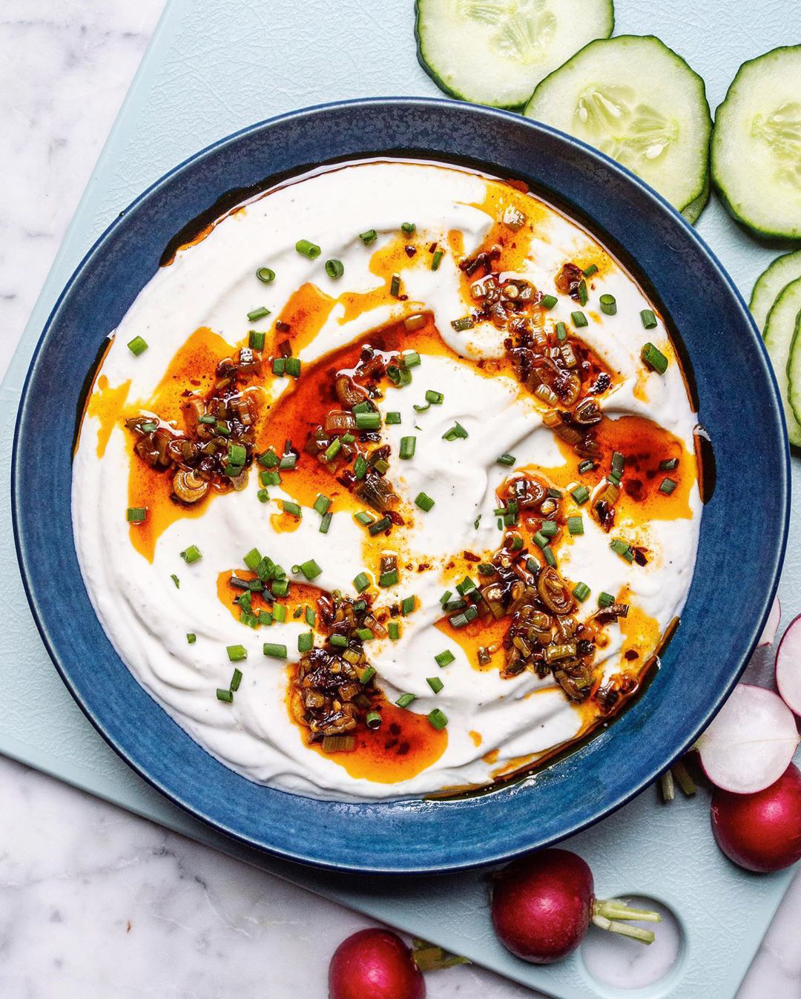

In [82]:
image_data[0]

In [7]:
tester = open_image(r"C:\Users\William\OneDrive\Code\Output\BTq_pkllZsp.jpg")

In [86]:
learn = load_learner(r"C:\Users\William\OneDrive\Code\Output","First Attempt.pkl")

AssertionError: Torch not compiled with CUDA enabled

In [84]:
learn = load_learner("", 'First Attempt.pkl')

FileNotFoundError: [Errno 2] No such file or directory: 'First Attempt.pkl'

In [21]:
result = (learn.predict(tester)[0].obj).item()

In [5]:
print(torch.__version__)

1.1.0


NameError: name 'fastai' is not defined

In [22]:
result

0.8799617886543274

In [29]:
import matplotlib.pyplot as plt

In [30]:
import imageio

In [31]:
photos = ['By-ZY9GnYCs.jpg', 'Bz3m3uMhImM.jpg', 'BzOne5_CvkQ.jpg', 'BzRELbAlmG8.jpg']

In [32]:
def create_grid()

SyntaxError: invalid syntax (<ipython-input-32-dd42867c3a80>, line 1)

In [33]:
root_photo_path = Path('Output')
img = imageio.imread(root_photo_path/photos[0])

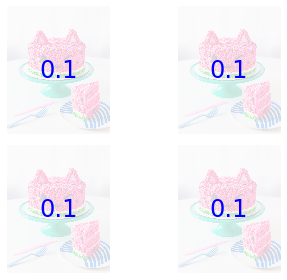

In [58]:
fig, axs = plt.subplots(2,2, )
for ax in axs.flatten():
    ax.imshow(img, alpha = 0.2)
    ax.axis('off')
    ax.text(0.5, 0.5, '0.1', horizontalalignment='center',  fontsize = 24, color = 'blue', verticalalignment='center', transform=ax.transAxes)
    #ax.patch.set_edgecolor('black')  

    #ax.patch.set_linewidth('1')  
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
plt.savefig('test.png', dpi = 100, bbox_inches = 'tight',
    pad_inches = 0)

In [39]:
axs[0]

array([<matplotlib.axes._subplots.AxesSubplot object at 0x00000163073CB248>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x0000016307432048>], dtype=object)

In [62]:
learn.get_preds([open_image(root_photo_path/photos[0])])

KeyboardInterrupt: 

In [63]:
files = ImageList.from_lists()

AttributeError: type object 'ImageList' has no attribute 'from_lists'

In [70]:
il = ImageList([root_photo_path/photos[i] for i in range(4)])

In [73]:
learn.pred_batch(il).shape

torch.Size([32, 1])

In [78]:
il

ImageList (4 items)
Image (3, 1350, 1080),Image (3, 1337, 1080),Image (3, 1350, 1080),Image (3, 1080, 1080)
Path: .

In [74]:
learn.predict(open_image(root_photo_path/photos[0]))

(FloatItem [1.04122], tensor([1.0412]), tensor([1.0412]))

In [79]:
learn.data.test_ds = il

AttributeError: can't set attribute

In [42]:
learn = load_learner()

TypeError: load_learner() missing 1 required positional argument: 'path'

In [71]:
import imageio


input_img = np.random.randint(0, 3, (100,100))
colour_dict = {0:[0,0,0],
               1:[255,0,0],
               2:[0,0,255]
              }

h,w = test_img.shape
for value, colour in colour_dict.items():
    output_img = np.ones((h, w, 3), dtype = 'uint8')*255
    output_img[input_img==value, :] = colour
    imageio.imsave(f'output_{value}.png', output_img)

In [68]:
output_img[test_img==4, :] = [255, 0, 0]

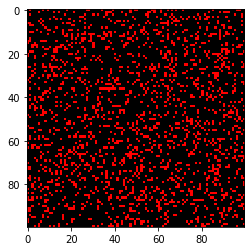

In [69]:
plt.imshow(output_img)

In [64]:
imageio.imsave('test.png', output_img, )

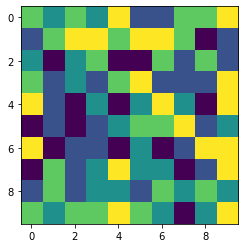

In [23]:
plt.imshow(test_img)

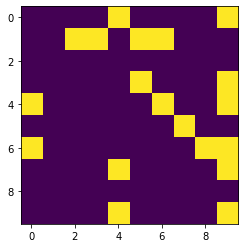

In [27]:
plt.imshow(test_img==4)

In [51]:
output_img[-1,3, 1]

100.0